Visualizing the evolution of coronal fields throught a simulated solar cycle
================================ 

## Import all the necasary modules

In [1]:
# listing system files
import glob 

# working with arrays
import numpy as np 

# plotting and animations 
import matplotlib.pyplot as plt
import matplotlib.image as mgimg
import matplotlib.animation as animation

# importing IDL save files 
from scipy.io import readsav as idlsave

# computing PFSS solution and tracing field lines
import pfsspy
import pfsspy.utils
from pfsspy import coords, tracing

# sunpy to create map objects
import sunpy 

# astropy to evaluate astronomical contants and define units
import astropy.units as u
from astropy.time import Time
import astropy.constants as const
from astropy.coordinates import SkyCoord


## Locate all of the simulation files
- ddir:  `str` name of the data storage directory 
- sun:   id `str` for the simulation 
- names: `str` list with sorted names of each of the simulation `.sav` files

In [2]:
ddir  = '/Users/maco7096/WORKING/SIMULATIONS/SolarCycle/Data/'
sun   = '*SC_lmax28_lmax28.sav'
names = sorted(glob.glob(ddir + sun))

## Save each frame of the sourface imput field and the PFSS extrapolation

In [3]:
# define directory to save plots  
outdir = '/Users/maco7096/WORKING/SIMULATIONS/SolarCycle/Plots/'

# tracer for field lines 
tracer = tracing.FortranTracer()
r = 1.2 * const.R_sun

# define the plotting grid for the PFSS field lines
lat = np.linspace(-np.pi / 2, np.pi / 2, 8, endpoint=False)
lon = np.linspace(0, 2 * np.pi, 8, endpoint=False)
lat, lon = np.meshgrid(lat, lon, indexing='ij')
lat, lon = lat.ravel() * u.rad, lon.ravel() * u.rad

# define input values: 
# number of vertical slices
nrho = 25
# distance of Source Surface in solar radii 
rss = 2.5

In [4]:
# initial value 
i = 0
# value for the magnatic field scale 
a = 100

# loop through the names of each of the simulation files
for name in names:    
    fig1 = plt.figure(figsize=(5,5))
    fig2 = plt.figure(figsize=(5,5)) 
    
    # axes for photospheric fields
    ax1 = fig1.add_subplot(111)
    # axes for PFSS fields
    ax2 = fig2.add_subplot(111, projection='3d')
    
    sav_data = idlsave(name)
    data   = sav_data['b_rad_lmax'] 
    # use any time corresponding to the simulation
    header = pfsspy.utils.carr_cea_wcs_header(Time('2021-11-30'), data.T.shape)
    
    dmap = sunpy.map.Map(data,header)
    
    pfss_in = pfsspy.Input(dmap, nrho, rss)
    pfss_out = pfsspy.pfss(pfss_in)
    
    # plot the photospheric map
    m  = pfss_in.map
    ax1.imshow(m.data,origin = "lower",cmap="seismic",vmin = -a,vmax = a)
    ax1.set_title('Photospheric field')
    ax1.set_xlabel('Longitude [deg.]')
    ax1.set_ylabel('Latitude [deg.]')
    
    # plot the coronal field lines from the PFSS solution
    seeds = SkyCoord(lon, lat, r, frame=pfss_out.coordinate_frame)
    field_lines = tracer.trace(seeds, pfss_out)

    for field_line in field_lines:
        color = {0: 'black', -1: 'tab:blue', 1: 'tab:red'}.get(field_line.polarity)
        coords = field_line.coords
        coords.representation_type = 'cartesian'
        ax2.plot(coords.x / const.R_sun,
                coords.y / const.R_sun,
                coords.z / const.R_sun,
                color=color, linewidth=1)
        

    ax2.set_title('PFSS field')
    ax2.set_xlim((-2.5,2.5))
    ax2.set_ylim((-2.5,2.5))
    ax2.set_zlim((-2.5,2.5))
    ax2.set_xlabel(r'x [$R_{\odot}$]')
    ax2.set_ylabel(r'y [$R_{\odot}$]')
    ax2.set_zlabel(r'z [$R_{\odot}$]')

    # save each of the plots
    fig1.savefig(outdir+'fig1_'+str(i).zfill(3)+'.png')
    fig2.savefig(outdir+'fig2_'+str(i).zfill(3)+'.png')
    plt.close('all')
    
    i = i+1

/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/

/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/opt/anaconda3/lib/python3.8/site-packages/pfsspy/tracing.py:178: UserWarning: At least one field line ran out of steps during tracing.
You should probably increase max_steps (currently set to auto) and try again.
  warnings.warn(
/Users/maco7096/

## Save each frame for the animation

<ipython-input-5-4c84f4490755>:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = fig.add_subplot(121)
<ipython-input-5-4c84f4490755>:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax2 = fig.add_subplot(122)


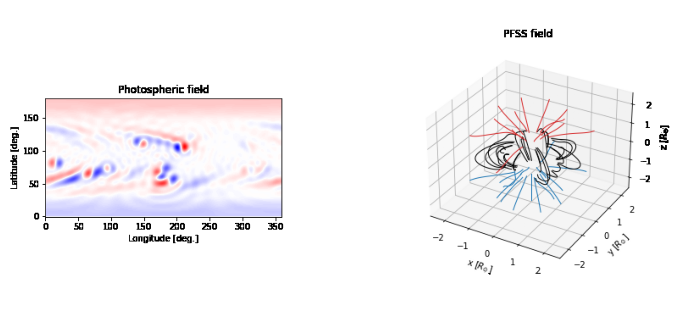

In [5]:
# embed the animation in the notebook
plt.rcParams["animation.html"] = "jshtml"

fig = plt.figure(figsize = (12,8))

# initiate an empty  list of "plotted" images 
myimages = []

# file names with photosphere field and PFSS solution field lines
names1 = sorted(glob.glob('/Users/maco7096/WORKING/CU_CLASS/NPDE/FINALP/PFSS_Model/PLOTS/fig1*'))
names2 = sorted(glob.glob('/Users/maco7096/WORKING/CU_CLASS/NPDE/FINALP/PFSS_Model/PLOTS/fig2*'))

#loops through available png:s
for i in range(len(names1)):
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ## Read in picture
    img1 = mgimg.imread(names1[i])
    img2 = mgimg.imread(names2[i])
    
    imgplot1 = ax1.imshow(img1)
    imgplot2 = ax2.imshow(img2)
    
    ax1.set_axis_off()
    ax2.set_axis_off()

    # append AxesImage object to the list
    myimages.append([imgplot1,imgplot2])

## Show the animation of the full cycle

In [6]:
# create an instance of animation
my_anim = animation.ArtistAnimation(fig, myimages, interval=1000, blit=True, repeat_delay=1000)
# show the animation embedded in the notebook 
my_anim

# Information on simulation files:
The simulations of photospheric fields are from Lisa Theres Lehmann's thesis data published in 2019. For more information plese look into the following [link](https://risweb.st-andrews.ac.uk/portal/en/theses/cool-star-magnetic-field-topologies--connecting-simulations-and-observations-for-solarlike-stars(2d3bdbd8-d2dd-404e-a567-d635876f59bd).html). 